<a href="https://colab.research.google.com/github/harshdeepsinghrathaur/Data-Exploration-using-Python/blob/main/XAI_COVIDRisk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Group Members :**

*  HARSHDEEP SINGH RATHAUR

  Student ID -


*  
  Student ID -


# **Title of the Project:**

# **Exploring Factors Affecting Diabetes: A Comprehensive Data Analysis**
## **Brief Description :**
Analyze a diabetic dataset thoroughly, paying particular attention to trends,

*   Analyze a diabetic dataset thoroughly, paying particular attention to trends,correlations, and important variables.
*   In order to achieve a thorough knowledge, look for trends in important features using statistics and visualizations.
*   The investigation yields useful insights and suggestions after data cleansing, subgroup analysis, and maybe hypothesis testing.

# **Detailed Project Description**


# **Import Libraries**

In [ ]:

import numpy as np #
import pandas as pd #
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt

 **Set Up Your Dataset**
 Link of this dataset is: Onedrive

In [ ]:
# Uplpad your dataset to colab file option
dataset = pd.read_csv("training.csv")
dataset.head()


,Gender,Division,DType,Category,Symptom,ageGroup,class
0,male,Dhaka,NaN,NaN,Dental caries,20-30,0
1,female,Rajshahi,Medicine,Psychiatry,Anxiety disorder,20-30,0
2,male,Rajshahi,Medicine,GIT,Constipation,Nov-19,0
3,male,Rajshahi,NaN,NaN,Query about drug,31-50,0
4,male,Rajshahi,Medicine,Cardiovascular,IHD,60 or above,1


# **Null Value Elimination**

In [ ]:
dataset.dropna()

,Gender,Division,DType,Category,Symptom,ageGroup,class
1,female,Rajshahi,Medicine,Psychiatry,Anxiety disorder,20-30,0
2,male,Rajshahi,Medicine,GIT,Constipation,Nov-19,0
4,male,Rajshahi,Medicine,Cardiovascular,IHD,60 or above,1
5,male,Rajshahi,Medicine,Cardiovascular,Hypertension,60 or above,1
7,male,Rajshahi,Medicine,Cardiovascular,IHD,60 or above,1
...,...,...,...,...,...,...,...
19893,male,Dhaka,Surgery,ENT,Running nose,20-30,0
19894,male,Dhaka,Medicine,GIT,Enteric fever,31-50,0
19895,male,Chittagong,Surgery,ENT,FB in throat,20-30,0
19896,female,Chittagong,Medicine,Respiratory,Common cold,20-30,1


# **Write Preprocessing Function**

In [ ]:
from sklearn import preprocessing
def convert(data):
    number = preprocessing.LabelEncoder()
    #Gender	Division	DType	Category	Symptom	ageGroup	class
    data['Gender'] = number.fit_transform(data['Gender'].astype(str))
    data['Division'] = number.fit_transform(data['Division'].astype(str))
    data['DType'] = number.fit_transform(data['DType'].astype(str))
    data['Category'] = number.fit_transform(data['Category'].astype(str))
    data['Symptom'] = number.fit_transform(data['Symptom'].astype(str))
    data['ageGroup'] = number.fit_transform(data['ageGroup'].astype(str))
    data['class'] = number.fit_transform(data['class'].astype(str))
    data= data.fillna(-999)
    return data




# **Preprocess Dataset**

In [ ]:
ds = convert(dataset)

# **Isolate attributes to X and Y**

In [ ]:
X = ds.drop('class', axis=1)
y = ds['class']

# **Split Dataset into 80:20 Train:Test format**

In [ ]:
# Calling Train test split function. Here 0.20 menas 20% test data. You can change as per your choice
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
DTclassifier = DecisionTreeClassifier(criterion="entropy", max_depth=3)
DTclassifier.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

# **Eperiment with SVM ML Model**

# **Part-1: Classification Problem**

In [ ]:
from sklearn.svm import SVC
svclassifier=SVC(kernel='poly',degree=2, probability= True)
svclassifier.fit(X_train,y_train)


SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=2, gamma='scale', kernel='poly',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

If you are watching some output like  below:
SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,decision_function_shape='ovr', degree=3, gamma='scale', kernel='linear',max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001, verbose=False)

# **Congratulations!!! Your model is working!!!**

# **Let's Check the Explainability of the Model with LIME library**

In [ ]:
pip install lime

     |████████████████████████████████| 276kB 8.0MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp37-none-any.whl size=283846 sha256=455eaf7891e9878a68cde7ab266321bdda1b0f47d47c237d30e26c0098e446fc
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime


In [ ]:
#import lime_tabular
from lime import lime_tabular
# Explainer function varies differently. Please see the documentation. Search by lime_tabular.LimeTabularExplainer
#LIME documentation: https://lime-ml.readthedocs.io/en/latest/lime.html
#Download in PDF:https://readthedocs.org/projects/lime-ml/downloads/pdf/latest/
explainer_svm = lime_tabular.LimeTabularExplainer(training_data = X_train.values, mode='classification', training_labels=None, feature_names= X_train.columns,
categorical_features=None, categorical_names=None, kernel_width=None, verbose=False, class_names=None, feature_selection='auto', discretize_continuous=True, discretizer='quartile')

#**Assign Prediction to a variable**

In [ ]:
predict_fn_svm= svclassifier.predict_proba

# **Check explaiblity of prediction for a specific instance in the dataset.**
In this case risk of cardiovascular disease according to fitness data has been explained for individuals

In [ ]:
# (X_test.iloc[i]) selects individual person from the test dataset

for i in range (0,5):
    #print (X_test.iloc[i])
    exp_svm = explainer_svm.explain_instance(X_test.iloc[i], predict_fn_svm)
    exp_svm.show_in_notebook(show_predicted_value= True)

# **Let's view the details in list also ('attribute' relational operator value', negative or positive contribution)**

In [ ]:
 exp_svm.as_list()

[('DType <= 1.00', 0.456275231625528),
 ('Symptom <= 108.00', -0.13990628498425928),
 ('13.00 < Category <= 19.00', -0.024372458871411994),
 ('ageGroup > 3.00', -0.012578217710668907),
 ('Division <= 2.00', 0.012310620848584366),
 ('0.00 < Gender <= 1.00', 0.0030111855288075793)]

# **Experiment with Decision Tree model**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
DTclassifier = DecisionTreeClassifier(criterion="entropy", max_depth=3)
DTclassifier.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

If you are watching some output like below:
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=3, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

# *Congratulations!!! Your model is working!!! *

In [ ]:
#import lime_tabular
from lime import lime_tabular
# Explainer function varies differently. Please see the documentation. Search by lime_tabular.LimeTabularExplainer
#LIME documentation: https://lime-ml.readthedocs.io/en/latest/lime.html
#Download in PDF:https://readthedocs.org/projects/lime-ml/downloads/pdf/latest/
explainer_DT = lime_tabular.LimeTabularExplainer(training_data = X_train.values, mode='classification', training_labels=None, feature_names= X_train.columns,
categorical_features=None, categorical_names=None, kernel_width=None, verbose=False, class_names=None, feature_selection='auto', discretize_continuous=True, discretizer='quartile')

In [ ]:
predict_fn_DT= DTclassifier.predict_proba

In [ ]:
# (X_test.iloc[i]) selects individual person from the test dataset

for i in range (0,5):
    #print (X_test.iloc[i])
    exp_DT = explainer_DT.explain_instance(X_test.iloc[i], predict_fn_DT)
    exp_DT.show_in_notebook(show_predicted_value= True)

# ***Comparison: DT Classifier VS SVM Classifier ***

In [ ]:
exp_DT_list = exp_DT.as_list()
exp_svm_list = exp_svm.as_list()


print("""results:

     DT \t\t\t\t\t\t\t\t\t SVM""")

for x, y in zip(exp_DT_list, exp_svm_list):
    print(x, y, sep='\t\t')

results:

     DT 									 SVM
('Symptom <= 108.00', 0.17170683336544912)		('DType <= 1.00', 0.456275231625528)
('13.00 < Category <= 19.00', -0.028156667307233933)		('Symptom <= 108.00', -0.13990628498425928)
('DType <= 1.00', 0.01693739590499957)		('13.00 < Category <= 19.00', -0.024372458871411994)
('ageGroup > 3.00', 0.005629347564561277)		('ageGroup > 3.00', -0.012578217710668907)
('Division <= 2.00', -0.003508742179831383)		('Division <= 2.00', 0.012310620848584366)
('0.00 < Gender <= 1.00', 0.0015453791837599215)		('0.00 < Gender <= 1.00', 0.0030111855288075793)


In [5]:


import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

In [2]:
from google.colab import files
uploaded = files.upload()


Saving covid.csv to covid.csv


In [6]:

df = pd.read_csv("covid.csv")
df

,Age,Address,Duration,Incoming_calls,outgoing_calls,incoming_messages,longest_call,missed_calls,outgoing_call,Active_time,...,nervous,sleephr,walkinghr,exercisehr,idlehr,heart_rate,sleep_pattern,appetite,obesity,class
0,30,1,300,3,3,2,120.0,1,100,12.0,...,0.0,7.0,0.5,0.0,6.0,110.0,0,0,0,1
1,29,1,300,3,3,2,120.0,1,100,10.0,...,0.0,0.5,0.0,6.0,110.0,80.0,0,0,1,0
2,50,1,150,15,10,12,7200.0,4,3800,10.0,...,0.0,6.0,1.0,1.0,0.0,78.0,0,0,0,1
3,20,1,10,3,3,16,180.0,10,180,5.0,...,1.0,5.0,15.0,1.0,4.0,95.0,1,1,1,1
4,32,1,90,15,10,10,15.0,0,20,9.0,...,0.0,6.0,1.0,0.0,6.0,0.0,1,0,0,0
5,19,1,200,6,3,1,5.0,2,5,1.0,...,0.0,7.0,0.0,20.0,24.0,80.0,1,1,1,1
6,28,1,500,3,1,20,100.0,4,4,7.0,...,1.0,5.0,1.0,0.0,6.0,119.0,1,1,1,1
7,46,1,120,50,20,20,10.0,10,10,8.0,...,1.0,6.0,0.3,0.3,0.3,100.0,0,0,0,1
8,31,1,100,30,20,10,10.0,6,3,1.0,...,0.0,7.0,1.0,1.0,1.0,75.0,0,0,0,1
9,50,0,360,6,3,30,NaN,50,30,4.0,...,1.0,3.0,0.0,0.0,5.0,120.0,1,1,1,1


In [7]:
df = df.drop([], axis=1)
df.head(5)

,Age,Address,Duration,Incoming_calls,outgoing_calls,incoming_messages,longest_call,missed_calls,outgoing_call,Active_time,...,nervous,sleephr,walkinghr,exercisehr,idlehr,heart_rate,sleep_pattern,appetite,obesity,class
0,30,1,300,3,3,2,120.0,1,100,12.0,...,0.0,7.0,0.5,0.0,6.0,110.0,0,0,0,1
1,29,1,300,3,3,2,120.0,1,100,10.0,...,0.0,0.5,0.0,6.0,110.0,80.0,0,0,1,0
2,50,1,150,15,10,12,7200.0,4,3800,10.0,...,0.0,6.0,1.0,1.0,0.0,78.0,0,0,0,1
3,20,1,10,3,3,16,180.0,10,180,5.0,...,1.0,5.0,15.0,1.0,4.0,95.0,1,1,1,1
4,32,1,90,15,10,10,15.0,0,20,9.0,...,0.0,6.0,1.0,0.0,6.0,0.0,1,0,0,0


In [8]:
df.shape

(26, 21)

In [9]:
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)

number of duplicate rows:  (0, 21)


In [10]:
df.count()

Age                  26
Address              26
Duration             26
Incoming_calls       26
outgoing_calls       26
incoming_messages    26
longest_call         25
missed_calls         26
outgoing_call        26
Active_time          22
posts                26
nervous              25
sleephr              26
walkinghr            25
exercisehr           25
idlehr               24
heart_rate           26
sleep_pattern        26
appetite             26
obesity              26
class                26
dtype: int64

In [11]:
df = df.drop_duplicates()
df.head(5)

,Age,Address,Duration,Incoming_calls,outgoing_calls,incoming_messages,longest_call,missed_calls,outgoing_call,Active_time,...,nervous,sleephr,walkinghr,exercisehr,idlehr,heart_rate,sleep_pattern,appetite,obesity,class
0,30,1,300,3,3,2,120.0,1,100,12.0,...,0.0,7.0,0.5,0.0,6.0,110.0,0,0,0,1
1,29,1,300,3,3,2,120.0,1,100,10.0,...,0.0,0.5,0.0,6.0,110.0,80.0,0,0,1,0
2,50,1,150,15,10,12,7200.0,4,3800,10.0,...,0.0,6.0,1.0,1.0,0.0,78.0,0,0,0,1
3,20,1,10,3,3,16,180.0,10,180,5.0,...,1.0,5.0,15.0,1.0,4.0,95.0,1,1,1,1
4,32,1,90,15,10,10,15.0,0,20,9.0,...,0.0,6.0,1.0,0.0,6.0,0.0,1,0,0,0


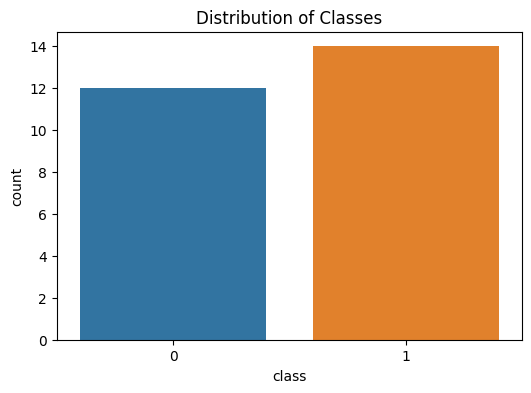

In [5]:
+lt.figure(figsize=(6, 4))
sns.countplot(x='class', data=df)
plt.title('Distribution of Classes')
plt.show()

In [13]:

X = df.drop('class', axis=1)
y = df['class']

rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X, y)

feature_importances = pd.Series(rf_classifier.feature_importances_, index=X.columns)
feature_importances.sort_values(ascending=False, inplace=True)

plt.figure(figsize=(10, 8))
feature_importances.plot(kind='bar')
plt.title('Feature Importances')
plt.show()

ValueError: ignored

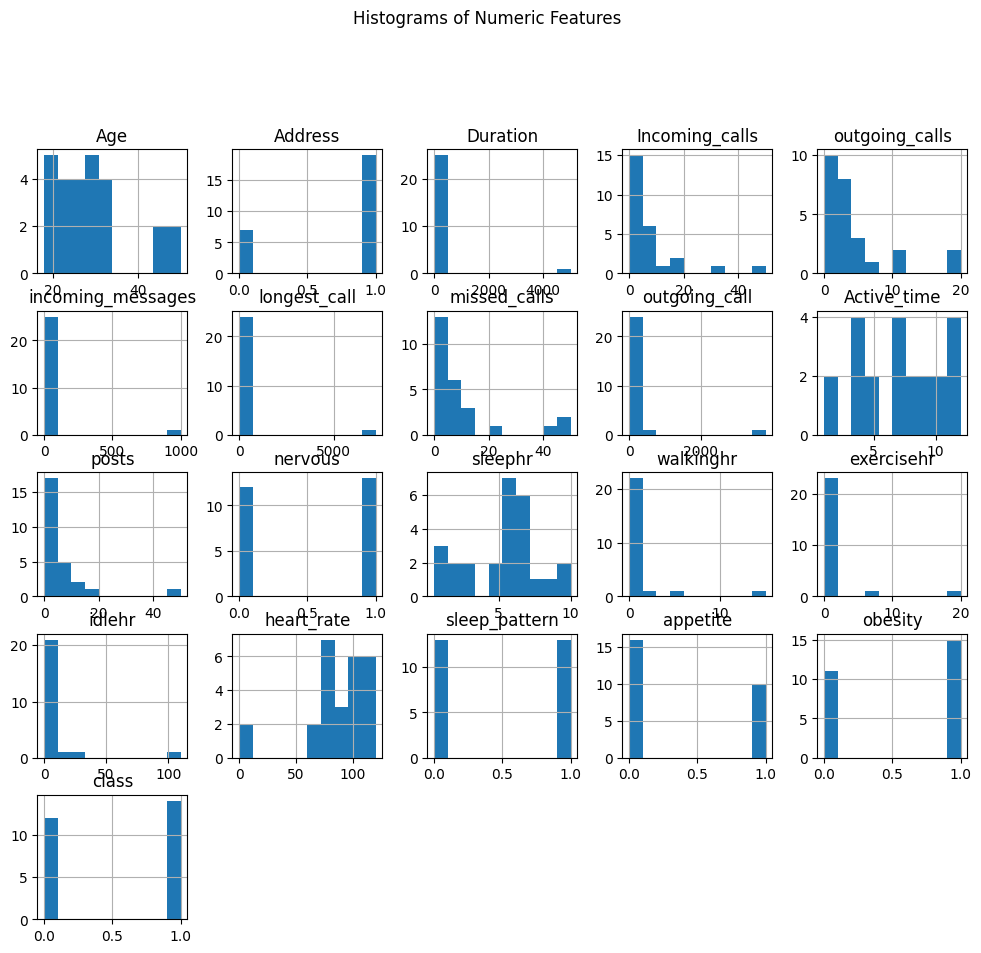

In [14]:
numeric_features = df.select_dtypes(include=['float64', 'int64']).columns
df[numeric_features].hist(figsize=(12, 10))
plt.suptitle('Histograms of Numeric Features', x=0.5, y=1.02, ha='center', fontsize='large')
plt.show()


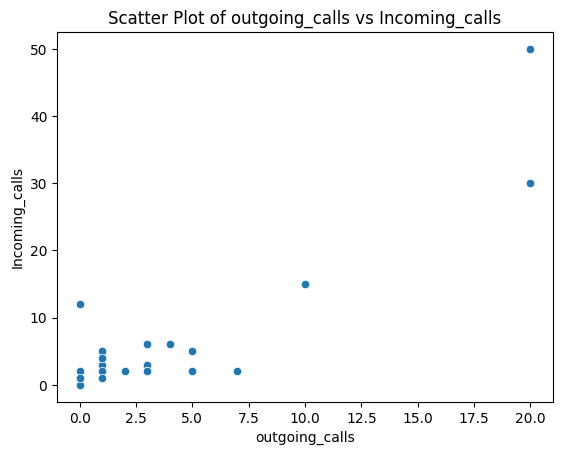

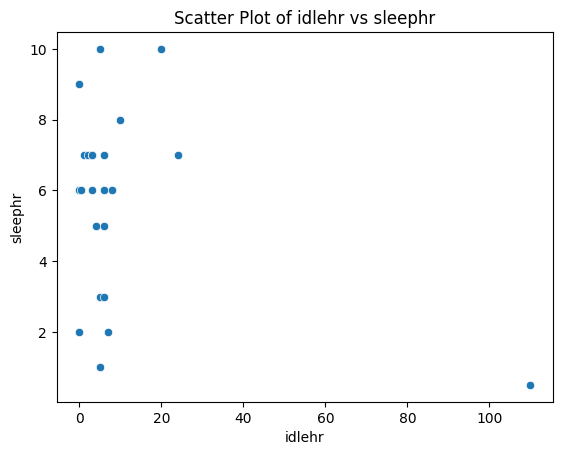

In [21]:

sns.scatterplot(x='outgoing_calls', y='Incoming_calls', data= df)
plt.title('Scatter Plot of outgoing_calls vs Incoming_calls')
plt.show()
sns.scatterplot(x='idlehr', y='sleephr', data= df)
plt.title('Scatter Plot of idlehr vs sleephr')
plt.show()

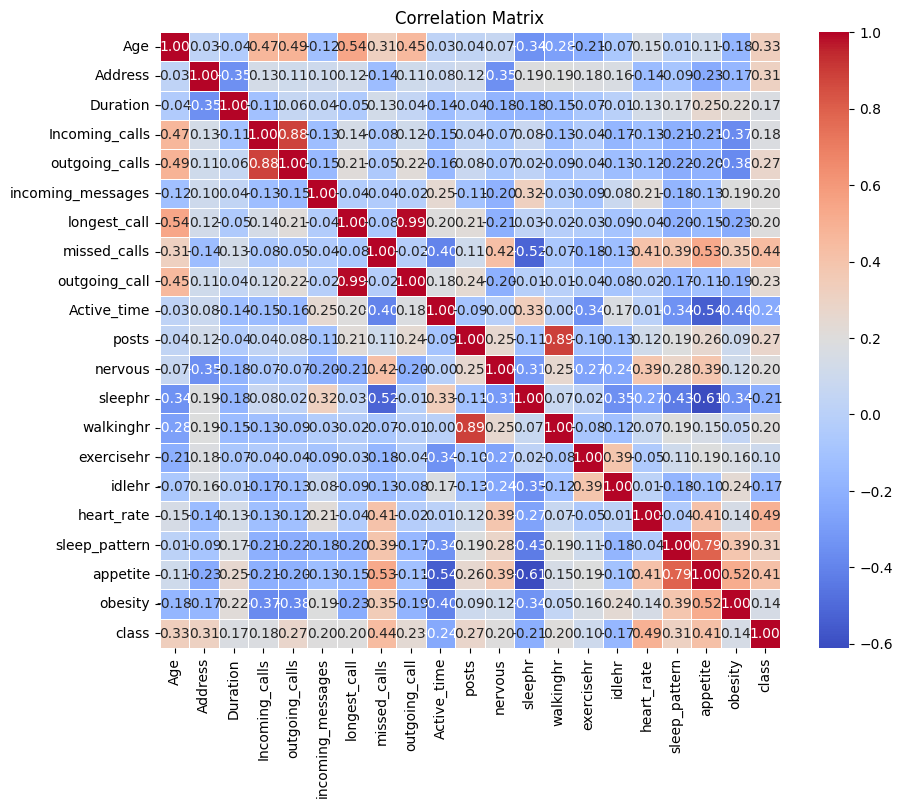

In [16]:

correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [23]:
selected_df = df['Duration',	'Incoming_calls',	'outgoing_calls',	'incoming_messages',	'longest_call',	'missed_calls',	'outgoing_call',	'Active_time']

# Calculate the correlation matrix
correlation_matrix = selected_df.corr()

# Print or use the correlation matrix as needed
print(correlation_matrix)

KeyError: ignored

In [22]:
correlation_matrix = df.corr('Duration',	'Incoming_calls',	'outgoing_calls',	'incoming_messages',	'longest_call',	'missed_calls',	'outgoing_call',	'Active_time')
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

TypeError: ignored

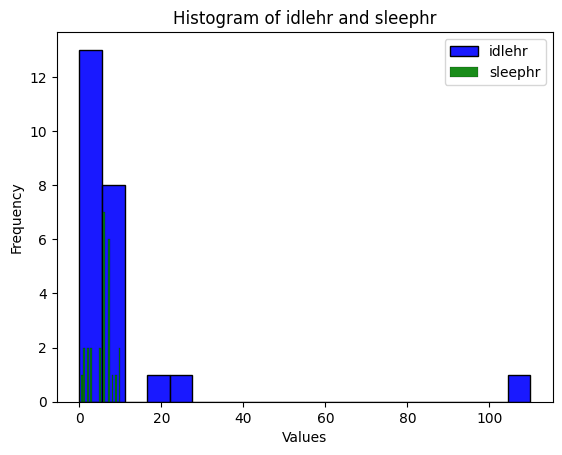

In [26]:

sns.histplot(data=df, x='idlehr', bins=20, color='blue', alpha=0.9, label='idlehr')
sns.histplot(data=df, x='sleephr', bins=22, color='green', alpha=0.9, label='sleephr')
plt.title('Histogram of idlehr and sleephr')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.legend()
plt.show()

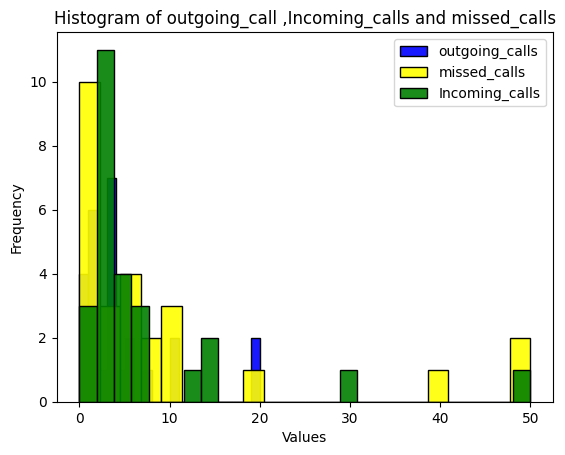

In [33]:
sns.histplot(data=df, x='outgoing_calls', bins=20, color='blue', alpha=0.9, label='outgoing_calls')
sns.histplot(data=df, x='missed_calls', bins=22, color='yellow', alpha=0.9, label='missed_calls')
sns.histplot(data=df, x='Incoming_calls', bins=26, color='green', alpha=0.9, label='Incoming_calls')
plt.title('Histogram of outgoing_call ,Incoming_calls and missed_calls')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) th

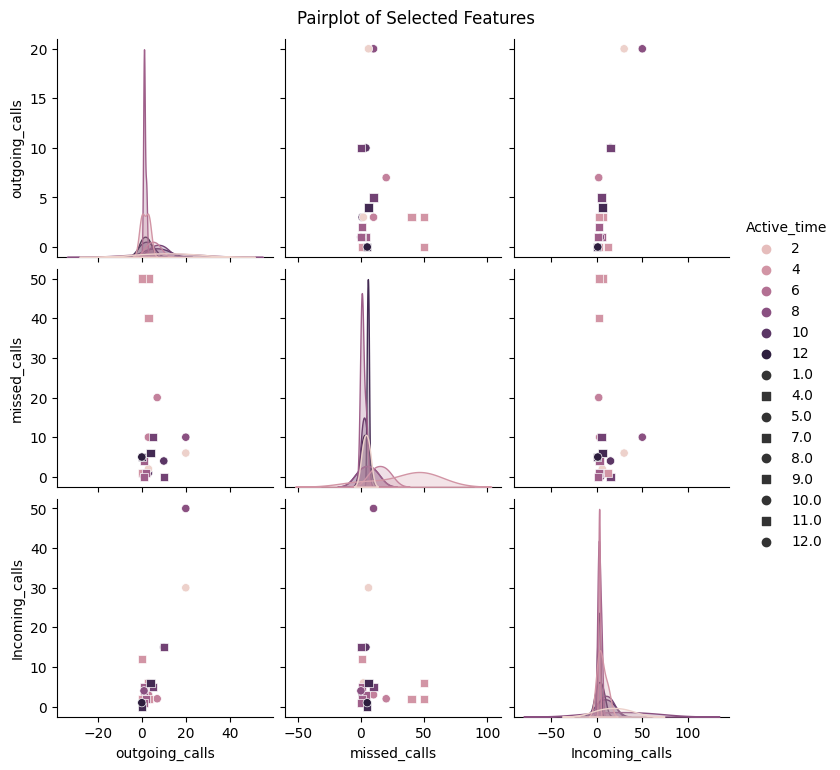

In [35]:

selected_features = ['outgoing_calls', 'missed_calls', 'Incoming_calls', 'Active_time']
sns.pairplot(df[selected_features], hue='Active_time', markers=['o', 's'])
plt.suptitle('Pairplot of Selected Features', y=1.02, ha='center', fontsize='large')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) than needed (9) and will cycle, which may produce an uninterpretable plot.
  func(x=x, y=y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1609: UserWarning: 
The markers list has fewer values (2) th

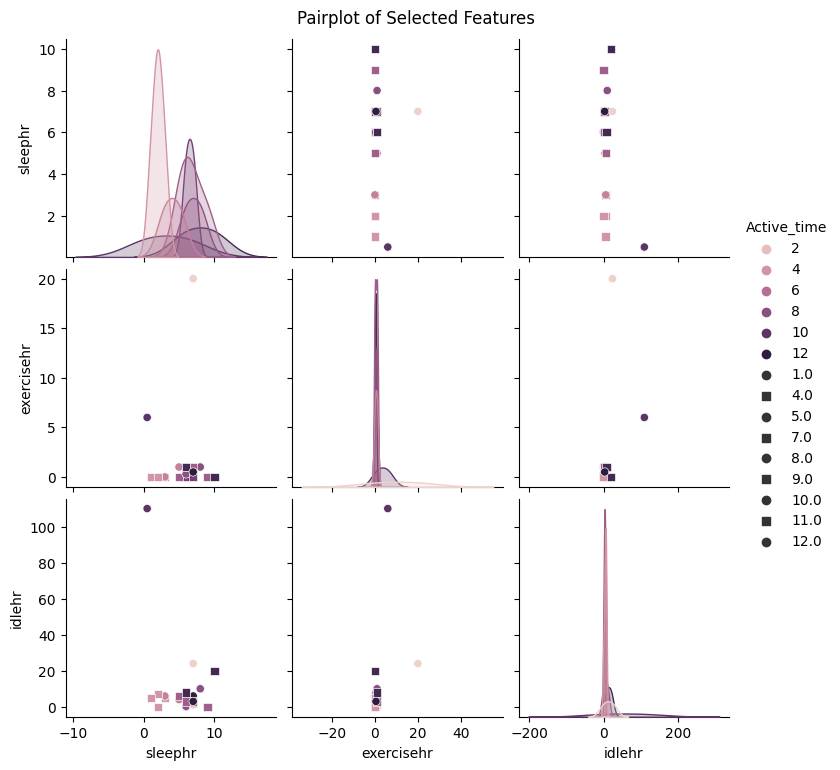

In [40]:
selected_features = ['sleephr','exercisehr',	'idlehr','Active_time']
sns.pairplot(df[selected_features], hue='Active_time', markers=['o', 's'])
plt.suptitle('Pairplot of Selected Features', y=1.02, ha='center', fontsize='large')
plt.show()

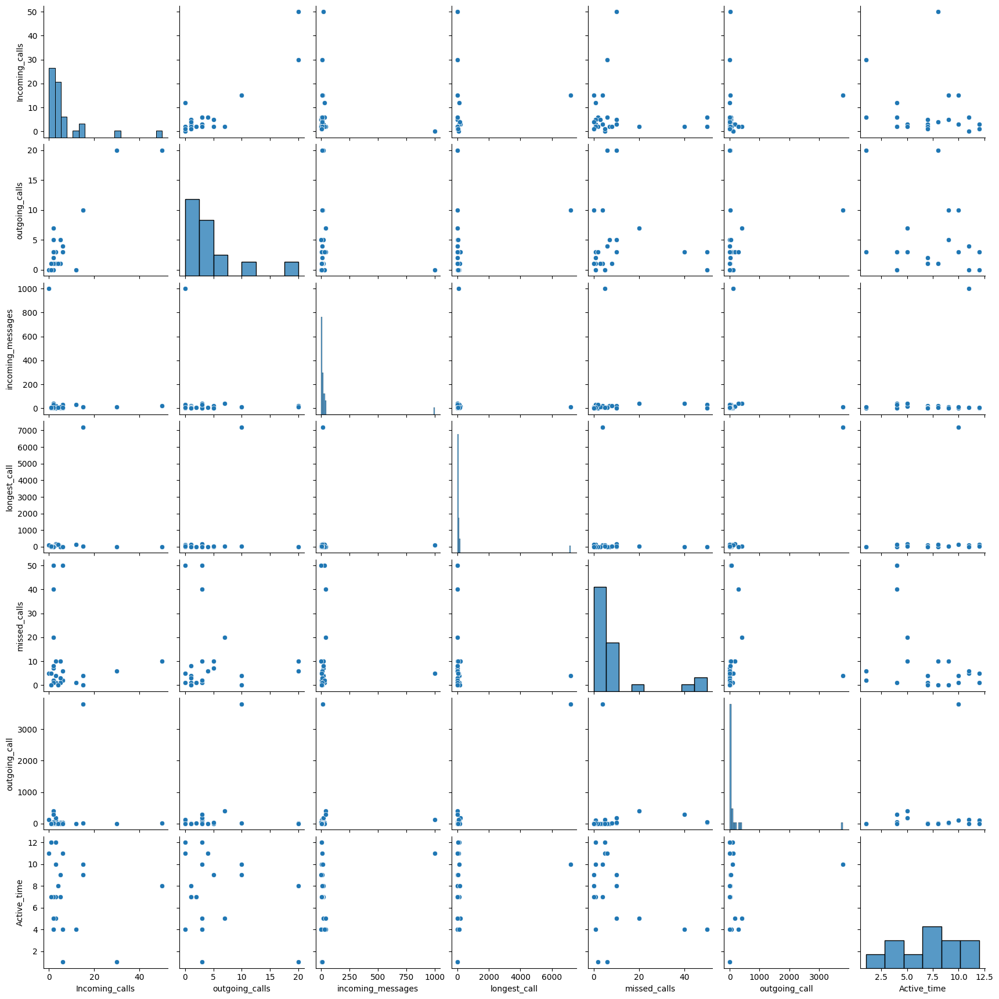

In [37]:
selected_columns = ['Incoming_calls',	'outgoing_calls',	'incoming_messages',	'longest_call',	'missed_calls',	'outgoing_call',	'Active_time']

# Read the CSV file into a DataFrame
# df = pd.read_csv(csv_file_path)

# Extract the specified columns
selected_df = df[selected_columns]

# Create a pair plot
sns.pairplot(selected_df)
plt.show()